In [ ]:
!pip install torch torchvision

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
!git clone https://github.com/sagecodes/geese-object-detection-dataset

Cloning into 'geese-object-detection-dataset'...
remote: Enumerating objects: 143, done.
remote: Total 143 (delta 0), reused 0 (delta 0), pack-reused 143
Receiving objects: 100% (143/143), 47.74 MiB | 34.02 MiB/s, done.
Resolving deltas: 100% (1/1), done.


In [ ]:
!pip install matplotlib

# WORKING

In [ ]:
import torch
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
from torchvision.transforms import transforms as T
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.ops import box_iou

# Check the available device
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [ ]:
# Define the custom collate function
def collate_fn(batch):
    return tuple(zip(*batch))

# Define the transformations for the images
transform = T.Compose([T.ToTensor()])

# Load the dataset
dataset = CocoDetection(root='/content/geese-object-detection-dataset/', annFile='/content/geese-object-detection-dataset/train.json', transform=transform)

# Use the custom collate function
data_loader = DataLoader(dataset, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


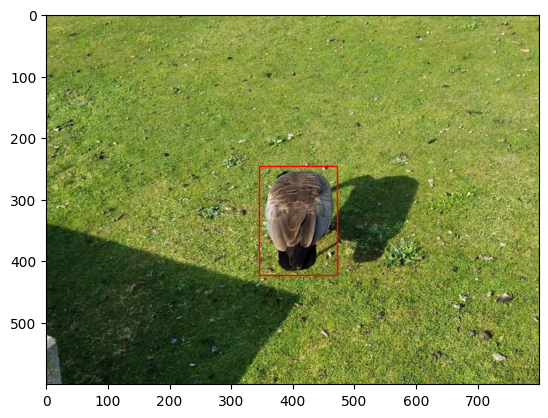

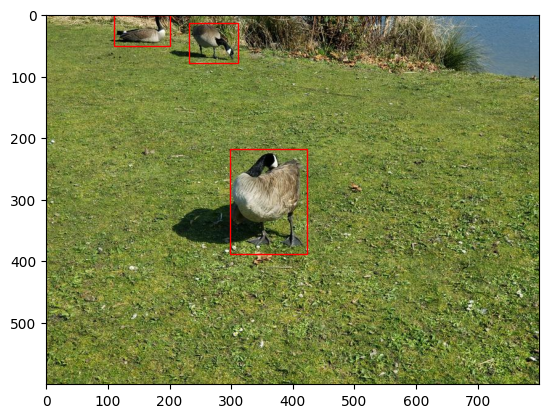

In [ ]:
# Function to display an image with its bounding boxes
def show_image_with_boxes(image, annotations):
    fig, ax = plt.subplots(1)
    ax.imshow(image.permute(1, 2, 0))  # Convert image tensor to (H, W, C) format for visualization

    for annotation in annotations:
        bbox = annotation['bbox']
        # Create a rectangle patch
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()

# Visualize a batch of images
for images, targets in data_loader:
    for i, image in enumerate(images):
        show_image_with_boxes(image, targets[i])
    break  # Display only the first batch

In [ ]:
# Load a pre-trained faster RCNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
model.roi_heads.box_predictor

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=91, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=364, bias=True)
)

In [ ]:
# Replace the classifier with a new one (number of classes + 1 for the background)
num_classes = 2  # Example: 1 class (goose) + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

In [ ]:
model.roi_heads.box_predictor

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=2, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=8, bias=True)
)

In [ ]:
# Move the entire model to the correct device
model.to(device)

# Define optimizer and learning rate
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# Learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# number of epochs for training loops
num_epochs = 2

In [ ]:
# Function to filter out and correct invalid boxes
# This is an optoinal step if your dataset may contain invalid annotations
def filter_and_correct_boxes(targets):
    filtered_targets = []
    for target in targets:
        boxes = target['boxes']
        labels = target['labels']
        valid_indices = []
        for i, box in enumerate(boxes):
            if box[2] > box[0] and box[3] > box[1]:
                valid_indices.append(i)
            else:
                print(f"Invalid box found and removed: {box}")
        filtered_boxes = boxes[valid_indices]
        filtered_labels = labels[valid_indices]
        filtered_targets.append({'boxes': filtered_boxes, 'labels': filtered_labels})
    return filtered_targets

#### Model Training

In [ ]:
# training loops
for epoch in range(num_epochs):
    model.train()
    i = 0
    for images, targets in data_loader:
        images = list(image.to(device) for image in images)
        targets = [{ 'boxes': torch.tensor([obj['bbox'] for obj in t], dtype=torch.float32).to(device),
                     'labels': torch.tensor([obj['category_id'] for obj in t], dtype=torch.int64).to(device)}
                   for t in targets]

        for target in targets:
            boxes = target['boxes']
            # Convert [x, y, width, height] to [x_min, y_min, x_max, y_max]
            boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
            boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
            target['boxes'] = boxes

        targets = filter_and_correct_boxes(targets)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]  # Move targets to device

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if i % 10 == 0:
            print(f"Epoch [{epoch}/{num_epochs}], Step [{i}/{len(data_loader)}], Loss: {losses.item():.4f}")
        i += 1

    lr_scheduler.step()

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch [0/2], Step [0/55], Loss: 1.4122
Epoch [0/2], Step [10/55], Loss: 0.3313
Epoch [0/2], Step [20/55], Loss: 0.1474
Epoch [0/2], Step [30/55], Loss: 0.3772
Epoch [0/2], Step [40/55], Loss: 0.1940
Epoch [0/2], Step [50/55], Loss: 0.2746
Epoch [1/2], Step [0/55], Loss: 0.1308
Epoch [1/2], Step [10/55], Loss: 0.2605
Epoch [1/2], Step [20/55], Loss: 0.0398
Epoch [1/2], Step [30/55], Loss: 0.2502
Epoch [1/2], Step [40/55], Loss: 0.2490
Epoch [1/2], Step [50/55], Loss: 0.0928


#Training + Eval

In [ ]:
test_dataset = CocoDetection(root='/content/geese-object-detection-dataset/', annFile='/content/geese-object-detection-dataset/test.json', transform=test_transform)


### Eval IOU on training Set

In [ ]:

# Evaluation
model.eval()
with torch.no_grad():
    for images, targets in data_loader:
        images = list(image.to(device) for image in images)
        targets = [{ 'boxes': torch.tensor([obj['bbox'] for obj in t], dtype=torch.float32).to(device),
                     'labels': torch.tensor([obj['category_id'] for obj in t], dtype=torch.int64).to(device)}
                   for t in targets]

        for target in targets:
            boxes = target['boxes']
            # Convert [x, y, width, height] to [x_min, y_min, x_max, y_max]
            boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
            boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
            target['boxes'] = boxes

        targets = filter_and_correct_boxes(targets)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]  # Move targets to device

        outputs = model(images)

        for i, output in enumerate(outputs):
            pred_boxes = output['boxes']
            true_boxes = targets[i]['boxes']
            iou = box_iou(pred_boxes, true_boxes)
            print(f"IOU: {iou.mean().item():.4f}")


IOU: 0.3338
IOU: 0.3029
IOU: 0.1580
IOU: 0.2298
IOU: 0.4395
IOU: 0.4813
IOU: 0.5287
IOU: 0.4497
IOU: 0.2747
IOU: 0.5415
IOU: 0.1496
IOU: 0.3126
IOU: 0.4422
IOU: 0.1077
IOU: 0.4019
IOU: 0.2021
IOU: 0.1761
IOU: 0.0950
IOU: 0.2001
IOU: 0.7201
IOU: 0.2840
IOU: 0.3110
IOU: 0.1823
IOU: 0.4616
IOU: 0.1402
IOU: 0.9212
IOU: 0.3925
IOU: 0.2868
IOU: 0.1899
IOU: 0.0998
IOU: 0.1754
IOU: 0.8954
IOU: 0.9267
IOU: 0.2336
IOU: 0.4235
IOU: 0.3352
IOU: 0.4497
IOU: 0.5192
IOU: 0.5322
IOU: 0.2068
IOU: 0.2281
IOU: 0.9039
IOU: 0.4414
IOU: 0.1825
IOU: 0.4714
IOU: 0.3725
IOU: 0.1215
IOU: 0.5305
IOU: 0.9350
IOU: 0.9345
IOU: 0.2313
IOU: 0.1553
IOU: 0.1014
IOU: 0.4551
IOU: 0.8937
IOU: 0.4389
IOU: 0.1556
IOU: 0.3192
IOU: 0.4802
IOU: 0.9523
IOU: 0.9314
IOU: 0.4670
IOU: 0.9592
IOU: 0.2191
IOU: 0.2123
IOU: 0.4930
IOU: 0.4359
IOU: 0.1281
IOU: 0.1897
IOU: 0.1347
IOU: 0.4427
IOU: 0.4400
IOU: 0.1251
IOU: 0.3051
IOU: 0.1821
IOU: 0.3081
IOU: 0.9190
IOU: 0.1230
IOU: 0.4152
IOU: 0.6795
IOU: 0.2999
IOU: 0.4570
IOU: 0.8933
IOU:

### Save & Load Model

In [ ]:
# Save the model's state dictionary
model_save_path = 'geese-object-detection-model.pth'
torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")


Model saved to geese-object-detection-model.pth


In [ ]:
# Load the model's state dictionary
model_load_path = 'geese-object-detection-model.pth'
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)  # Initialize the model
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)  # Adjust the classifier

model.load_state_dict(torch.load(model_load_path, map_location=device))  # Load the state dictionary
model.to(device)  # Move the model to the appropriate device
print(f"Model loaded from {model_load_path}")


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 162MB/s]


Model loaded from geese-object-detection-model.pth


# TEST

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


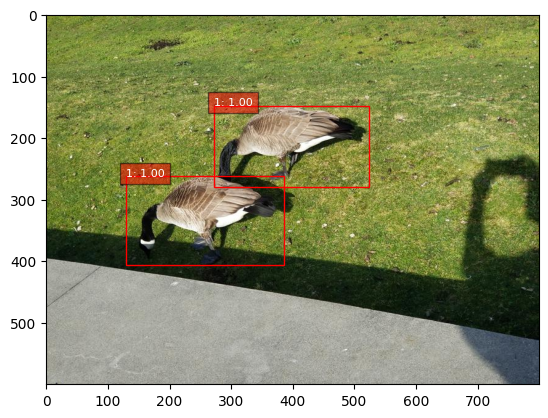

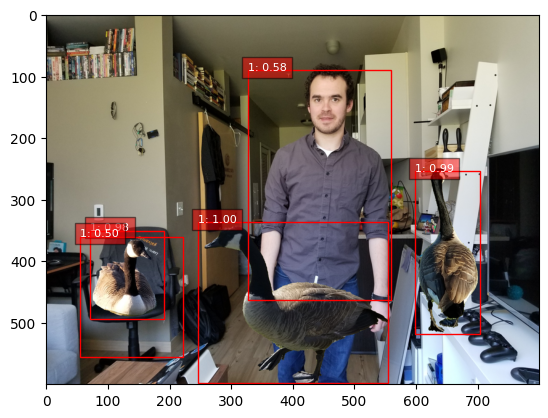

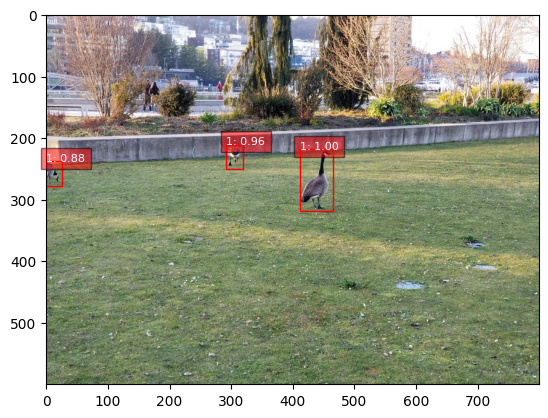

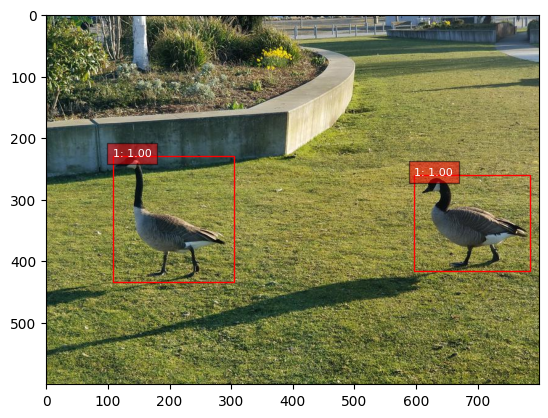

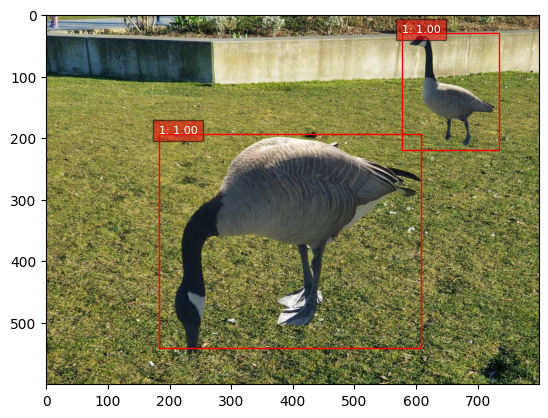

...

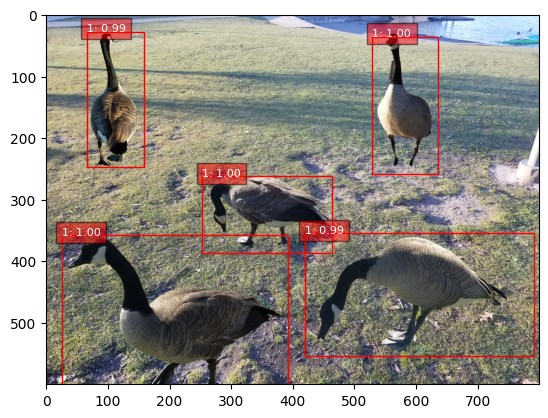

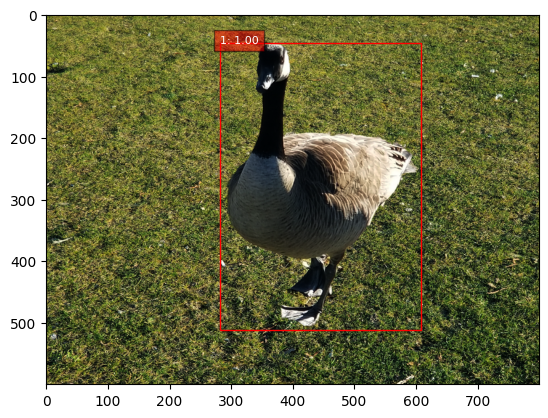

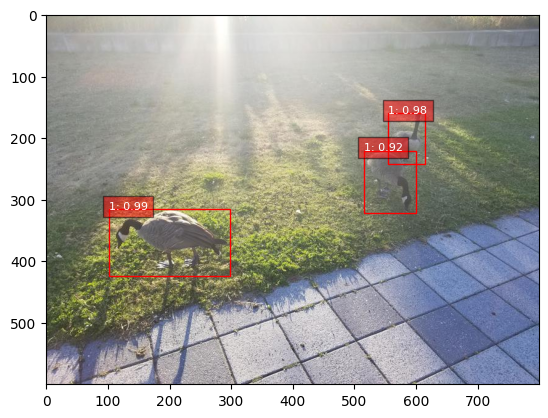

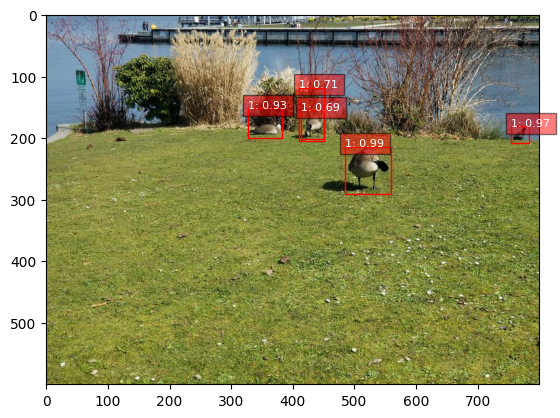

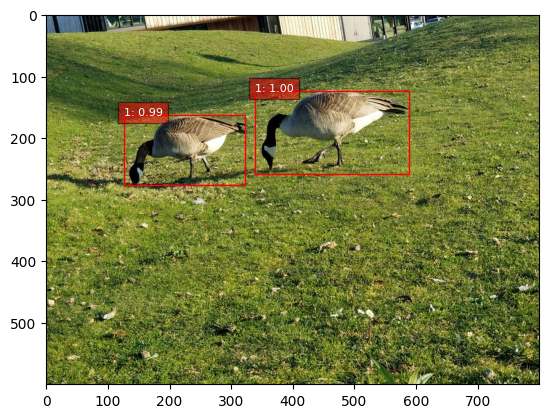

In [ ]:
# Define the transformations for the test images
test_transform = T.Compose([T.ToTensor()])

# Load the test dataset
test_dataset = CocoDetection(root='/content/geese-object-detection-dataset/', annFile='/content/geese-object-detection-dataset/test.json', transform=test_transform)

# Use the custom collate function for the test dataset
test_data_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=4, collate_fn=collate_fn)

# Function to display an image with its bounding boxes and labels
def show_image_with_predictions(image, predictions):
    fig, ax = plt.subplots(1)
    ax.imshow(image.permute(1, 2, 0))  # Convert image tensor to (H, W, C) format for visualization

    for prediction in predictions:
        bbox = prediction['bbox']
        score = prediction['score']
        label = prediction['label']
        # Create a rectangle patch
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='r', facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)
        plt.text(bbox[0], bbox[1], f"{label}: {score:.2f}", color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

    plt.show()

# Visualize predictions on the test dataset
model.eval()
with torch.no_grad():
    for images, targets in test_data_loader:
        images = list(image.to(device) for image in images)

        outputs = model(images)

        for i, output in enumerate(outputs):
            image = images[i].cpu()
            predictions = []
            for j in range(len(output['boxes'])):
                bbox = output['boxes'][j].cpu().numpy()
                score = output['scores'][j].cpu().item()
                label = output['labels'][j].cpu().item()
                if score > 0.5:  # Only display predictions with a confidence score above 0.5
                    predictions.append({'bbox': bbox, 'score': score, 'label': label})
            show_image_with_predictions(image, predictions)


# Working with Evaluate



In [ ]:
import torch
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
from torchvision.transforms import transforms as T
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.ops import box_iou

# Check the available device
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

# Define the custom collate function
def collate_fn(batch):
    return tuple(zip(*batch))

# Define the transformations for the images
transform = T.Compose([T.ToTensor()])

# Load the dataset
dataset = CocoDetection(root='/content/geese-object-detection-dataset/', annFile='/content/geese-object-detection-dataset/train.json', transform=transform)
data_loader = DataLoader(dataset, batch_size=2, shuffle=True, num_workers=4, collate_fn=collate_fn)

# Load a pre-trained model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.to(device)

# Replace the classifier with a new one (number of classes + 1 for the background)
num_classes = 2  # Example: 1 class (goose) + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
model.to(device)

# Define optimizer and learning rate
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# Learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Function to filter out and correct invalid boxes
def filter_and_correct_boxes(targets):
    filtered_targets = []
    for target in targets:
        boxes = target['boxes']
        labels = target['labels']
        valid_indices = []
        for i, box in enumerate(boxes):
            if box[2] > box[0] and box[3] > box[1]:
                valid_indices.append(i)
            else:
                print(f"Invalid box found and removed: {box}")
        filtered_boxes = boxes[valid_indices]
        filtered_labels = labels[valid_indices]
        filtered_targets.append({'boxes': filtered_boxes, 'labels': filtered_labels})
    return filtered_targets

# Function to evaluate the model
def evaluate_model(model, data_loader):
    model.eval()
    iou_list, loss_list = [], []
    correct_predictions, total_predictions = 0, 0
    with torch.no_grad():
        for images, targets in data_loader:
            images = [image.to(device) for image in images]
            targets = [{ 'boxes': torch.tensor([obj['bbox'] for obj in t], dtype=torch.float32).to(device),
                         'labels': torch.tensor([obj['category_id'] for obj in t], dtype=torch.int64).to(device)}
                       for t in targets]
            for target in targets:
                boxes = target['boxes']
                boxes[:, 2] += boxes[:, 0]
                boxes[:, 3] += boxes[:, 1]
                target['boxes'] = boxes

            targets = filter_and_correct_boxes(targets)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            outputs = model(images)

            for i, output in enumerate(outputs):
                pred_boxes = output['boxes']
                true_boxes = targets[i]['boxes']
                if pred_boxes.size(0) == 0 or true_boxes.size(0) == 0:
                    continue
                iou = box_iou(pred_boxes, true_boxes)
                iou_list.append(iou.mean().item())

                pred_labels = output['labels']
                true_labels = targets[i]['labels']

                # Ensure both tensors are the same size for comparison
                min_size = min(len(pred_labels), len(true_labels))
                correct_predictions += (pred_labels[:min_size] == true_labels[:min_size]).sum().item()
                total_predictions += min_size

    mean_iou = sum(iou_list) / len(iou_list) if iou_list else 0
    accuracy = correct_predictions / total_predictions if total_predictions else 0
    print(f"Mean IoU: {mean_iou:.4f}, Accuracy: {accuracy:.4f}")
    return mean_iou, accuracy

# Load the test dataset for evaluation
test_dataset = CocoDetection(root='/content/geese-object-detection-dataset/', annFile='/content/geese-object-detection-dataset/test.json', transform=transform)
test_data_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=4, collate_fn=collate_fn)

# Training loop
num_epochs = 10
best_mean_iou = 0

for epoch in range(num_epochs):
    model.train()
    for i, (images, targets) in enumerate(data_loader):
        images = [image.to(device) for image in images]
        targets = [{ 'boxes': torch.tensor([obj['bbox'] for obj in t], dtype=torch.float32).to(device),
                     'labels': torch.tensor([obj['category_id'] for obj in t], dtype=torch.int64).to(device)}
                   for t in targets]
        for target in targets:
            boxes = target['boxes']
            boxes[:, 2] += boxes[:, 0]
            boxes[:, 3] += boxes[:, 1]
            target['boxes'] = boxes

        targets = filter_and_correct_boxes(targets)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if i % 10 == 0:
            print(f"Epoch [{epoch}/{num_epochs}], Step [{i}/{len(data_loader)}], Loss: {losses.item():.4f}")

    lr_scheduler.step()

    mean_iou, accuracy = evaluate_model(model, test_data_loader)
    if mean_iou > best_mean_iou:
        best_mean_iou = mean_iou
        torch.save(model.state_dict(), 'best_model.pth')
        print("Best model saved")

print("Training completed.")


Using cuda device
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Epoch [0/10], Step [0/55], Loss: 1.0296
Epoch [0/10], Step [10/55], Loss: 0.3451
Epoch [0/10], Step [20/55], Loss: 0.1794
Epoch [0/10], Step [30/55], Loss: 0.1670
Epoch [0/10], Step [40/55], Loss: 0.0723
Epoch [0/10], Step [50/55], Loss: 0.5875
Mean IoU: 0.1980, Accuracy: 1.0000
Best model saved
Epoch [1/10], Step [0/55], Loss: 0.2349
Epoch [1/10], Step [10/55], Loss: 0.0972
Epoch [1/10], Step [20/55], Loss: 0.1080
Epoch [1/10], Step [30/55], Loss: 0.1918
Epoch [1/10], Step [40/55], Loss: 0.1268
Epoch [1/10], Step [50/55], Loss: 0.2028
Mean IoU: 0.3638, Accuracy: 1.0000
Best model saved
Epoch [2/10], Step [0/55], Loss: 0.1238
Epoch [2/10], Step [10/55], Loss: 0.0619
Epoch [2/10], Step [20/55], Loss: 0.1336
Epoch [2/10], Step [30/55], Loss: 0.0561
Epoch [2/10], Step [40/55], Loss: 0.0587
Epoch [2/10], Step

In [ ]:
# Load the model's state dictionary
model_load_path = '/content/best_model.pth'
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)  # Initialize the model
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)  # Adjust the classifier

model.load_state_dict(torch.load(model_load_path, map_location=device))  # Load the state dictionary
model.to(device)  # Move the model to the appropriate device
print(f"Model loaded from {model_load_path}")


Model loaded from /content/best_model.pth


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


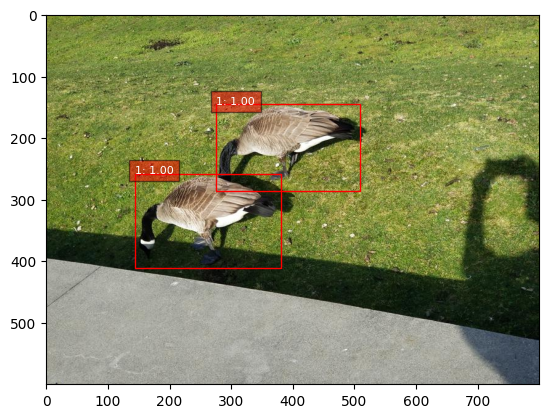

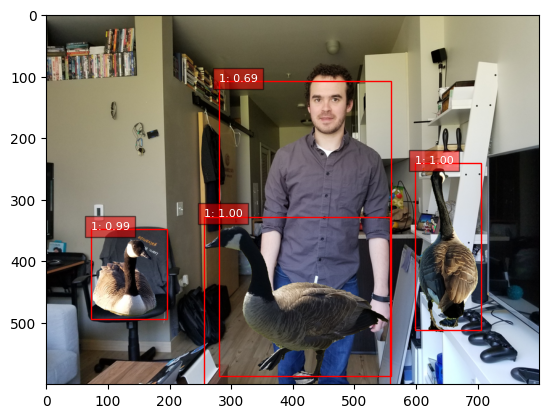

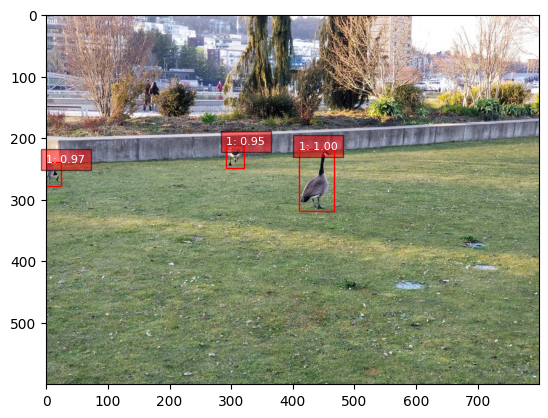

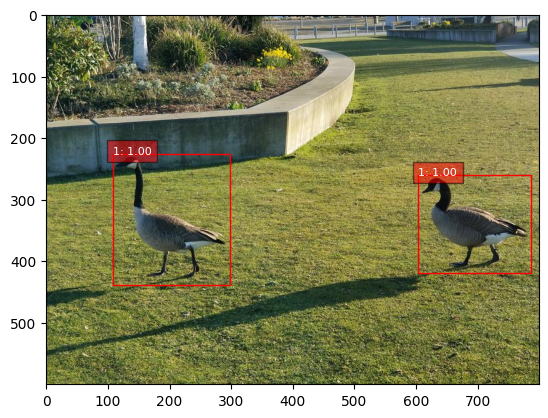

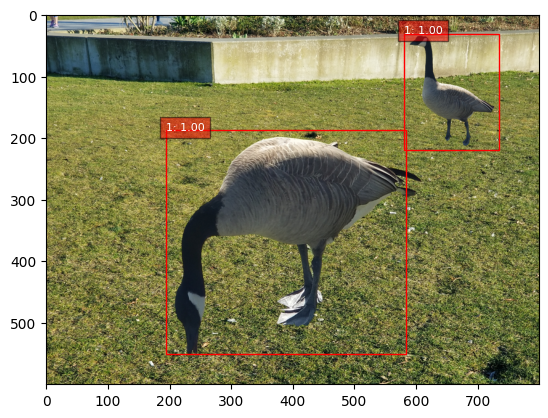

...

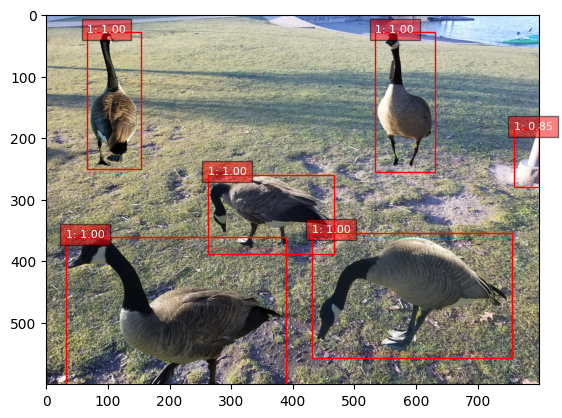

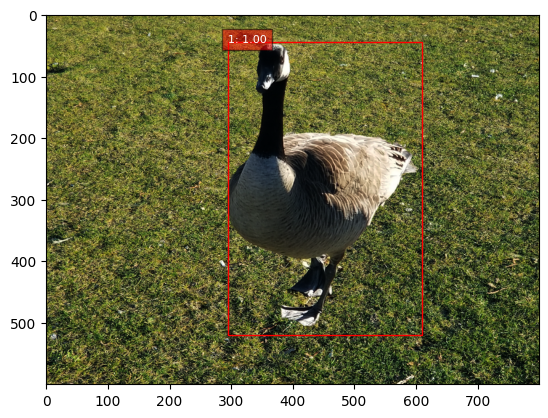

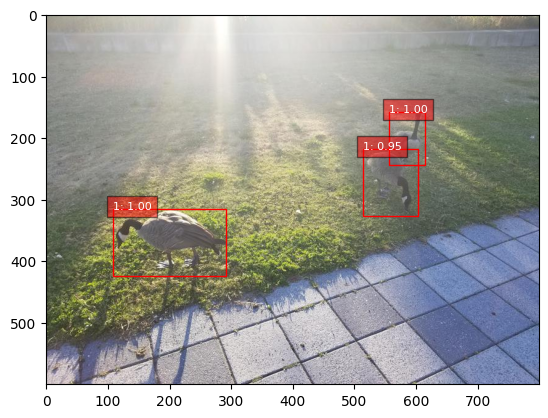

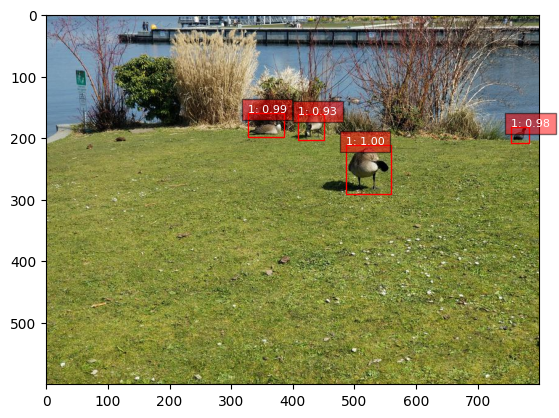

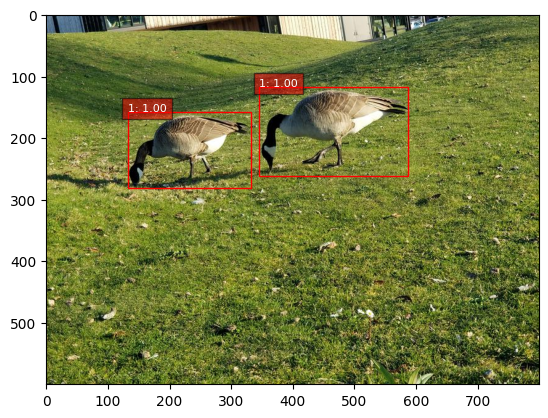

In [ ]:
# Define the transformations for the test images
test_transform = T.Compose([T.ToTensor()])

# Load the test dataset
test_dataset = CocoDetection(root='/content/geese-object-detection-dataset/', annFile='/content/geese-object-detection-dataset/test.json', transform=test_transform)

# Use the custom collate function for the test dataset
test_data_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=4, collate_fn=collate_fn)

# Function to display an image with its bounding boxes and labels
def show_image_with_predictions(image, predictions):
    fig, ax = plt.subplots(1)
    ax.imshow(image.permute(1, 2, 0))  # Convert image tensor to (H, W, C) format for visualization

    for prediction in predictions:
        bbox = prediction['bbox']
        score = prediction['score']
        label = prediction['label']
        # Create a rectangle patch
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='r', facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)
        plt.text(bbox[0], bbox[1], f"{label}: {score:.2f}", color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

    plt.show()

# Visualize predictions on the test dataset
model.eval()
with torch.no_grad():
    for images, targets in test_data_loader:
        images = list(image.to(device) for image in images)

        outputs = model(images)

        for i, output in enumerate(outputs):
            image = images[i].cpu()
            predictions = []
            for j in range(len(output['boxes'])):
                bbox = output['boxes'][j].cpu().numpy()
                score = output['scores'][j].cpu().item()
                label = output['labels'][j].cpu().item()
                if score > 0.5:  # Only display predictions with a confidence score above 0.5
                    predictions.append({'bbox': bbox, 'score': score, 'label': label})
            show_image_with_predictions(image, predictions)
